#import packages

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import anndata as ad
from anndata import AnnData, read_h5ad
import seaborn as sns
sns.set_style('white')

import sys
import warnings

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)




In [5]:
import scvelo as scv
import scanpy as sc
import cellrank as cr

In [6]:
scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2
sc.set_figure_params(dpi=150)

In [7]:
import petsc4py  # noqa


In [8]:
import slepc4py  # noqa

In [9]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.9.1 umap==0.5.3 numpy==1.19.2 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


# import dataset

In [10]:
rna = sc.read_h5ad('../data/20230619_allGastruloids_UMAP_celltypes.h5ad')
rna

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'dataset_colors', 'day_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'mark_colors', 'neighbors', 'old_celltype_colors', 'old_leiden_general_colors', 'old_

In [11]:
ct = pd.read_csv('../data/20230622_adata_obs_celltyping.csv',sep='\t',index_col=0)
ct.head(2)

,day,replicates,mark,celltype,celltype_general,lineage,predicted_id_E75,predicted_id_E85,prediction_confidence_E75,prediction_confidence_E85,predicted_final,old_leiden_general,old_celltype,old_leiden_merge,X_umap-0,X_umap-1
index,,,,,,,,,,,,,,,,
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,Gastd5,rep2,H3K27me3,Endothelium,Haemogenic,Haemogenic,Primitive Blood (Yolk Sac),Yolk sac; primitive blood,NaN,0.559873,Primitive Blood (Yolk Sac),Haemogenic,Haematoendothelial Progenitors,Haemogenic,-0.218837,12.208694
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,Gastd5,rep2,H3K27me3,Neural Progenitors,Neural Progenitors,Ectoderm,Posterior Epiblast & Primitive Streak,"Caudal Lateral Epiblast (dorsal, NMPs)",0.465498,0.812234,"Caudal Lateral Epiblast (dorsal, NMPs)",Neural,NMPs,NMPs,0.428891,3.563945


In [12]:
rna.obs[['celltype','lineage','celltype_general']] = ct[['celltype','lineage','celltype_general']]

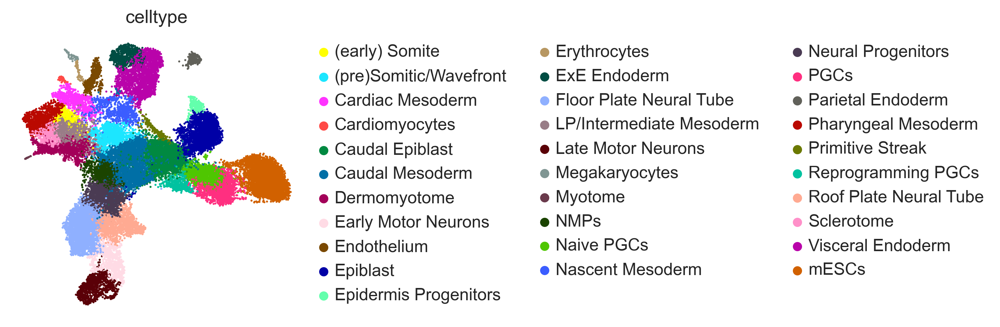

In [13]:
sc.pl.umap(rna,color='celltype',frameon=False,size = 10)

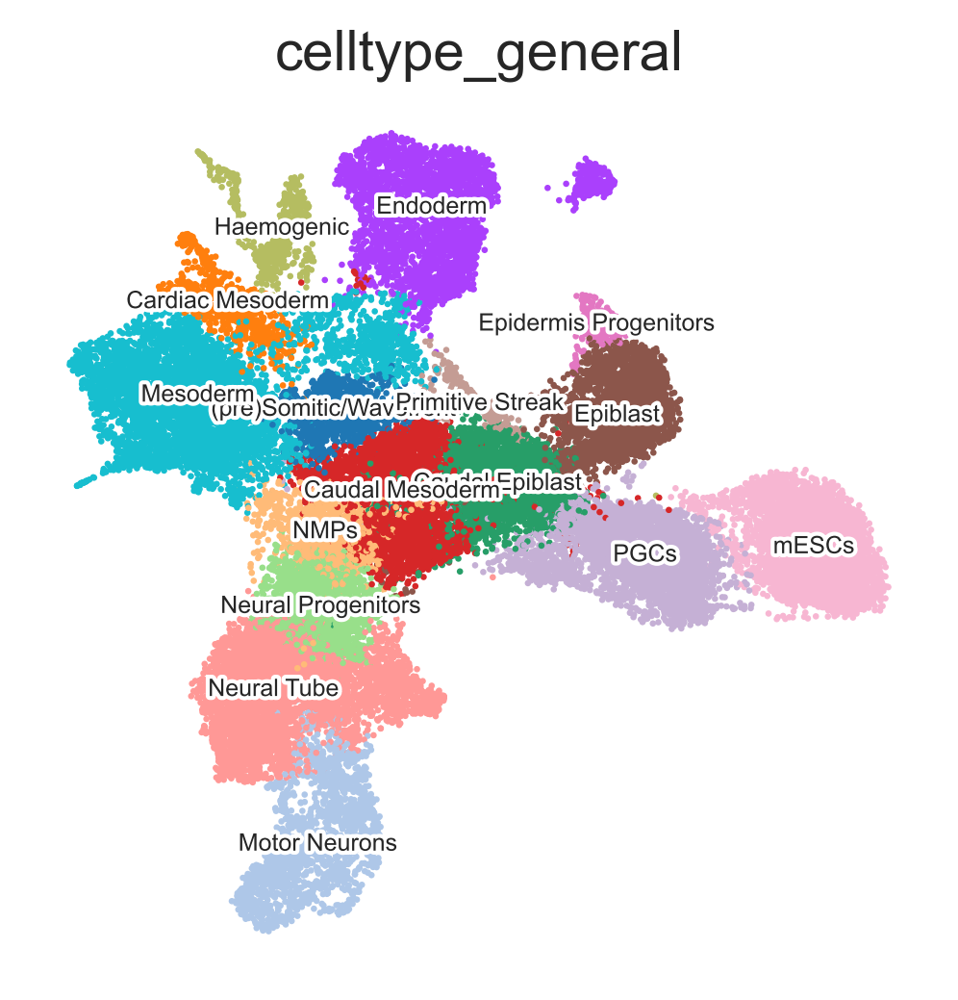

In [14]:
sc.pl.umap(rna,color='celltype_general',frameon=False,size = 10,legend_loc='on data',legend_fontoutline=2,legend_fontweight='light',legend_fontsize=6)

In [15]:
sns.color_palette(['#fc8d62','#e5c494','#b3b3b3','#66c2a5','#e78ac3', '#a6d854'])

[(0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254),
 (0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235)]

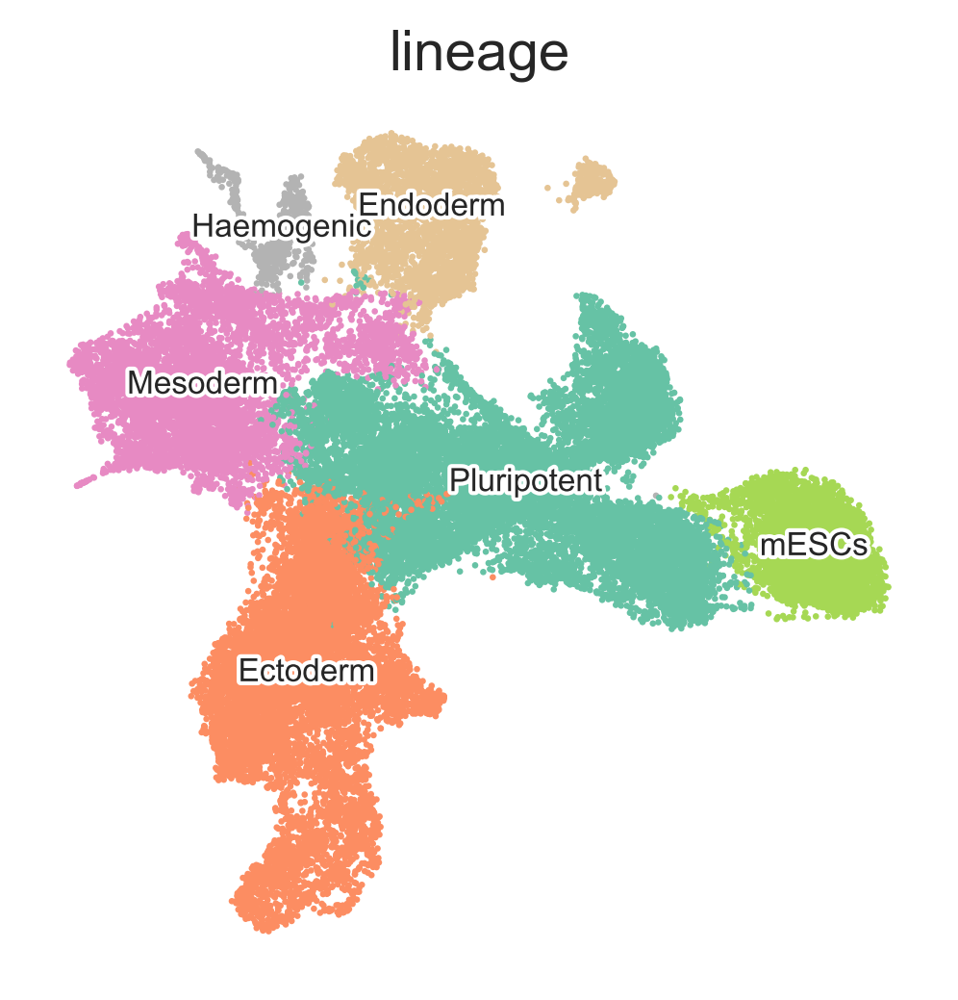

In [16]:
sc.pl.umap(rna,color='lineage',frameon=False,size = 10,legend_loc='on data',
           palette = ['#fc8d62','#e5c494','#b3b3b3','#e78ac3','#66c2a5', '#a6d854'],
           legend_fontoutline=2,legend_fontweight='light',legend_fontsize=8)

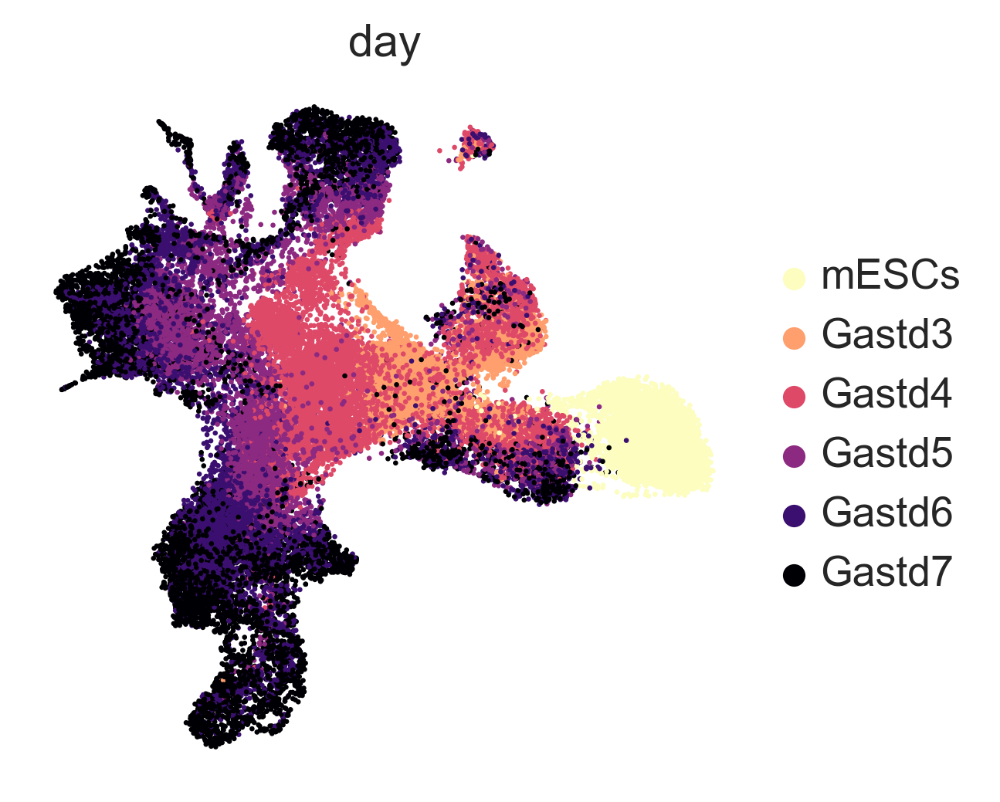

In [17]:
rna.obs['day'] = rna.obs['day'].cat.reorder_categories(['mESCs','Gastd3','Gastd4','Gastd5','Gastd6','Gastd7'])
sc.pl.umap(rna,color='day',frameon=False,size = 10, palette = 'magma_r')

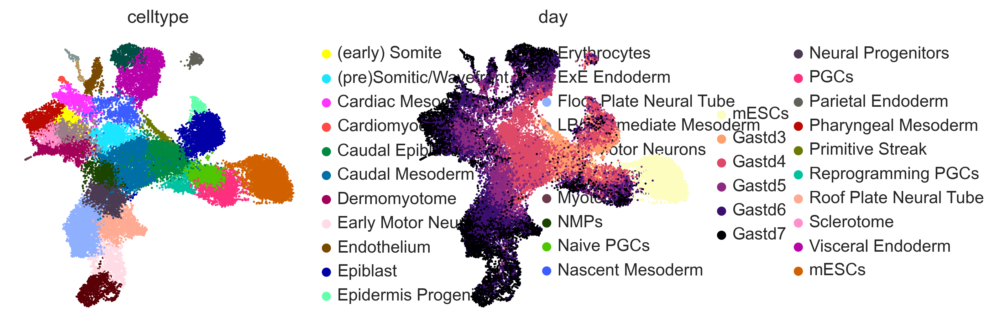

In [18]:
sc.pl.umap(rna,color=['celltype','day'],frameon=False,size = 10)

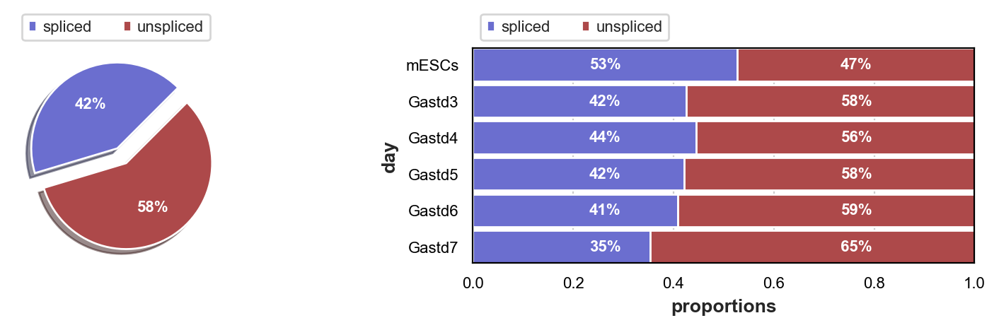

In [19]:
scv.pl.proportions(rna, groupby = 'day')


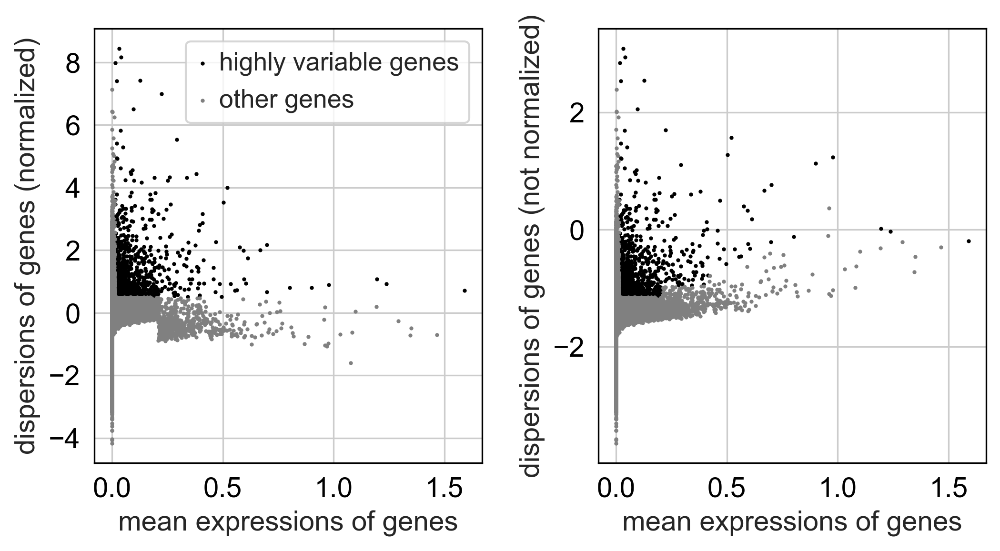

In [20]:
sc.pl.highly_variable_genes(rna)

In [21]:
sum(rna.var['highly_variable'])

1002

subset to only highly variable genes for easier computing

In [22]:
rna = rna[:, rna.var.highly_variable]

In [23]:
rna.obs['lineage'] = [sub.replace('mESCs', 'Pluripotent') for sub in rna.obs['lineage']]
rna.obs['day'] = rna.obs['day'].cat.reorder_categories(['mESCs','Gastd3','Gastd4','Gastd5','Gastd6','Gastd7'])
rna.obs['lin_day'] = rna.obs['lineage'].astype(str) + ' ' +rna.obs['day'].astype(str)
rna.obs['lin_day'] = rna.obs['lin_day'].astype('category')


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/2877207272.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rna.obs['lineage'] = [sub.replace('mESCs', 'Pluripotent') for sub in rna.obs['lineage']]


In [24]:
print(sns.color_palette('YlGn',5).as_hex())

['#edf8b2', '#bce395', '#77c679', '#379e54', '#0b713b']


In [25]:
(sns.color_palette('YlOrRd',6).as_hex())

['#ffea9b', '#fece6a', '#fea245', '#fc6832', '#ea2920', '#c20325']

In [26]:
order = ['Ectoderm Gastd3',
 'Ectoderm Gastd4',
 'Ectoderm Gastd5',
 'Ectoderm Gastd6',
 'Ectoderm Gastd7',
 'Endoderm mESCs',
 'Endoderm Gastd3',
 'Endoderm Gastd4',
 'Endoderm Gastd5',
 'Endoderm Gastd6',
 'Endoderm Gastd7',
 'Haemogenic Gastd4',
 'Haemogenic Gastd5',
 'Haemogenic Gastd6',
 'Haemogenic Gastd7',
 'Mesoderm Gastd3',
 'Mesoderm Gastd4',
 'Mesoderm Gastd5',
 'Mesoderm Gastd6',
 'Mesoderm Gastd7',
 'Pluripotent mESCs',
 'Pluripotent Gastd3',
 'Pluripotent Gastd4',
 'Pluripotent Gastd5',
 'Pluripotent Gastd6', 
 'Pluripotent Gastd7']
rna.obs['lin_day'] = rna.obs['lin_day'].cat.reorder_categories(order)


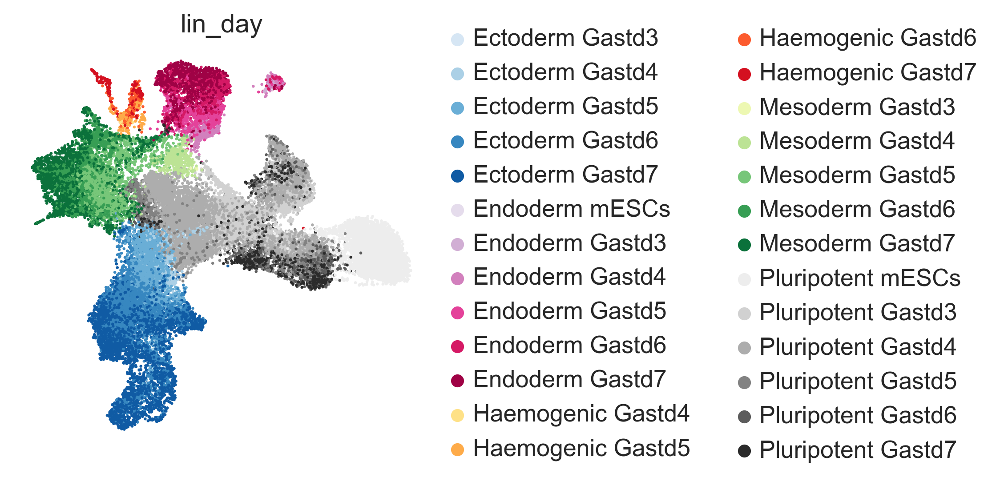

In [27]:
sc.pl.umap(rna,color='lin_day',frameon=False,
               palette = ['#d6e6f4', '#abd0e6', '#6aaed6', '#3787c0', '#105ba4',#blue
                          '#e5dcec', '#d1aed4', '#d280bd', '#e4429a', '#d51965', '#9f0245',#PuRD
                          '#fee187', '#feab49', '#fc5b2e', '#d41020', #YlOrRd
                          '#edf8b2', '#bce395', '#77c679', '#379e54', '#0b713b',#YlGn
                   '#ededed', '#d1d1d1', '#adadad', '#828282', '#5c5c5c', '#2b2b2b',#grey
                         ],
           size = 10)

In [28]:
rna

AnnData object with n_obs × n_vars = 38117 × 1002
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale', 'lineage', 'celltype_general', 'lin_day'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'dataset_colors', 'day_colors', 'hvg', 'leiden', 'log1p', 'mark_colors', 'neighbors', 'old_celltype_colors', 'old_leide

## calculate velocity and pseudotime

In [30]:
scv.tl.recover_dynamics(rna, n_jobs=2)#,use_raw=True)

recovering dynamics (using 2/8 cores)


  0%|          | 0/1002 [00:00<?, ?gene/s]

    finished (0:54:50) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [31]:
#scv.pp.moments(rna)

In [32]:
scv.tl.velocity(rna, mode="dynamical")


Normalized count data: spliced, unspliced.
computing neighbors


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:07) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:56) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [33]:
scv.tl.velocity_graph(rna)

computing velocity graph (using 1/8 cores)


  0%|          | 0/38117 [00:00<?, ?cells/s]

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  res = np.array(res) if as_array else res


    finished (0:00:50) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:13) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


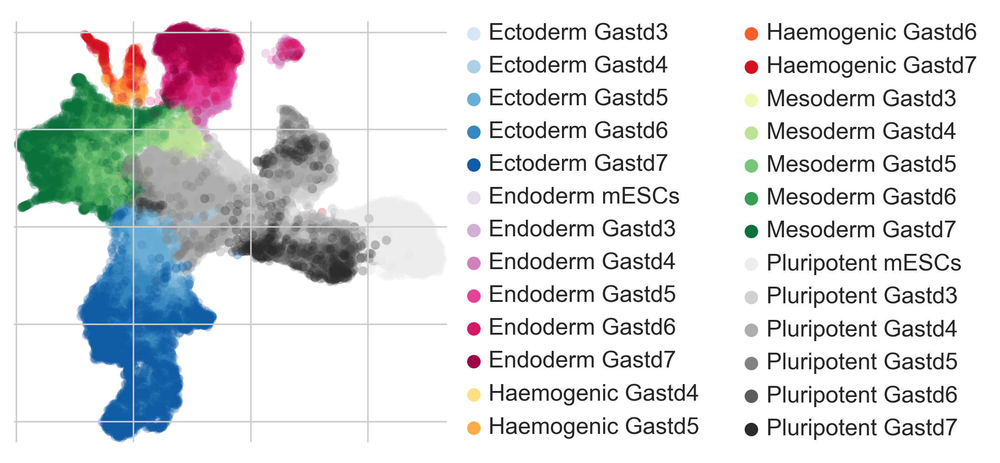

In [34]:
scv.pl.velocity_embedding_stream(
    rna, basis="umap", legend_fontsize=12, title="", smooth=0.8, min_mass=4,
     color = 'lin_day', legend_loc='right margin')

In [35]:
rna

AnnData object with n_obs × n_vars = 38117 × 1002
    obs: 'batch2', 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'cellnames', 'bc', 'cellname', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_counts_stressgenes', 'n_genes', 'S_score', 'G2M_score', 'phase', 'histone_score', 'mark_binary', 'enrichment', 'coverage', 'QC', 'umap_density_mark', 'predicted_id_E75', 'predicted_id_E85', 'prediction_confidence_E75', 'prediction_confidence_E85', 'predicted_final', 'leiden', 'celltype', 'old_leiden_general', 'old_celltype', 'old_leiden_merge', 'umap_1D', 'umap_1D_rescale', 'lineage', 'celltype_general', 'lin_day', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', '

In [36]:
cr.tl.terminal_states(rna, cluster_key="lin_day", weight_connectivities=0.2,
                     n_states)

Accessing `adata.obsp['T_fwd']`


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/1979725499.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.terminal_states(rna, cluster_key="lin_day", weight_connectivities=0.2, )
/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/38117 [00:00<?, ?cell/s]

Setting `softmax_scale=5.7584`


  0%|          | 0/38117 [00:00<?, ?cell/s]

    Finish (0:00:44)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:06)
Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:22)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


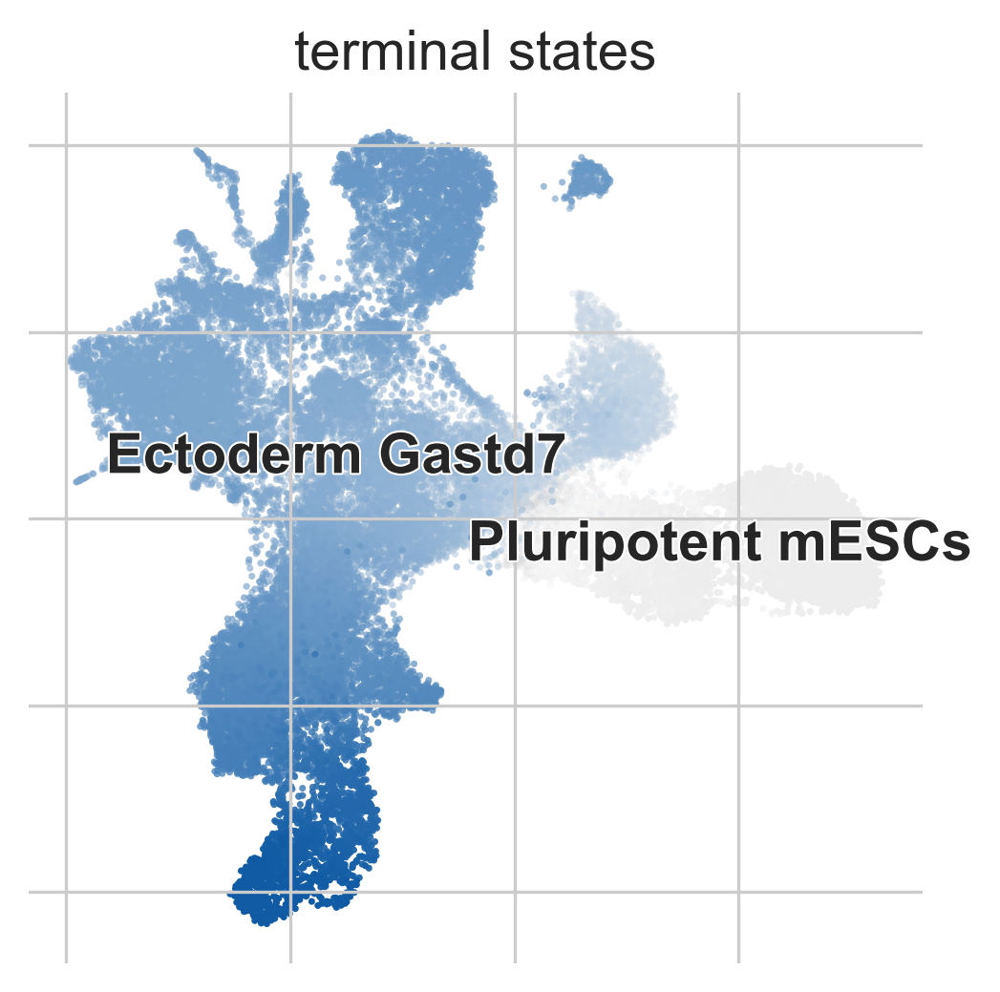

In [37]:
cr.pl.terminal_states(rna)

In [38]:
obs = rna.obs.copy()
obs.head(2)

,batch2,batch,day,replicates,mark,day_rep,dataset,cellnames,bc,cellname,...,old_leiden_merge,umap_1D,umap_1D_rescale,lineage,celltype_general,lin_day,velocity_self_transition,terminal_states,terminal_states_probs,clusters_gradients
index,,,,,,,,,,,,,,,,,,,,,
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AACCTGCT,341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,...,Haemogenic,-19.564241,0.058016,Haemogenic,Haemogenic,Haemogenic Gastd5,0.186058,NaN,0.798214,Ectoderm Gastd7
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATGGTGG,310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,...,NMPs,13.201415,0.642296,Ectoderm,Neural Progenitors,Ectoderm Gastd5,0.293731,NaN,0.778911,Ectoderm Gastd7


Accessing `adata.obsp['T_bwd']`


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/419163981.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.initial_states(rna, cluster_key="lin_day",n_jobs=1, backend='threading')
/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/cellrank/tl/_init_term_states.py:156: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = transition_matrix(


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/38117 [00:00<?, ?cell/s]

Setting `softmax_scale=5.7584`


  0%|          | 0/38117 [00:00<?, ?cell/s]

    Finish (0:00:36)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:05)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


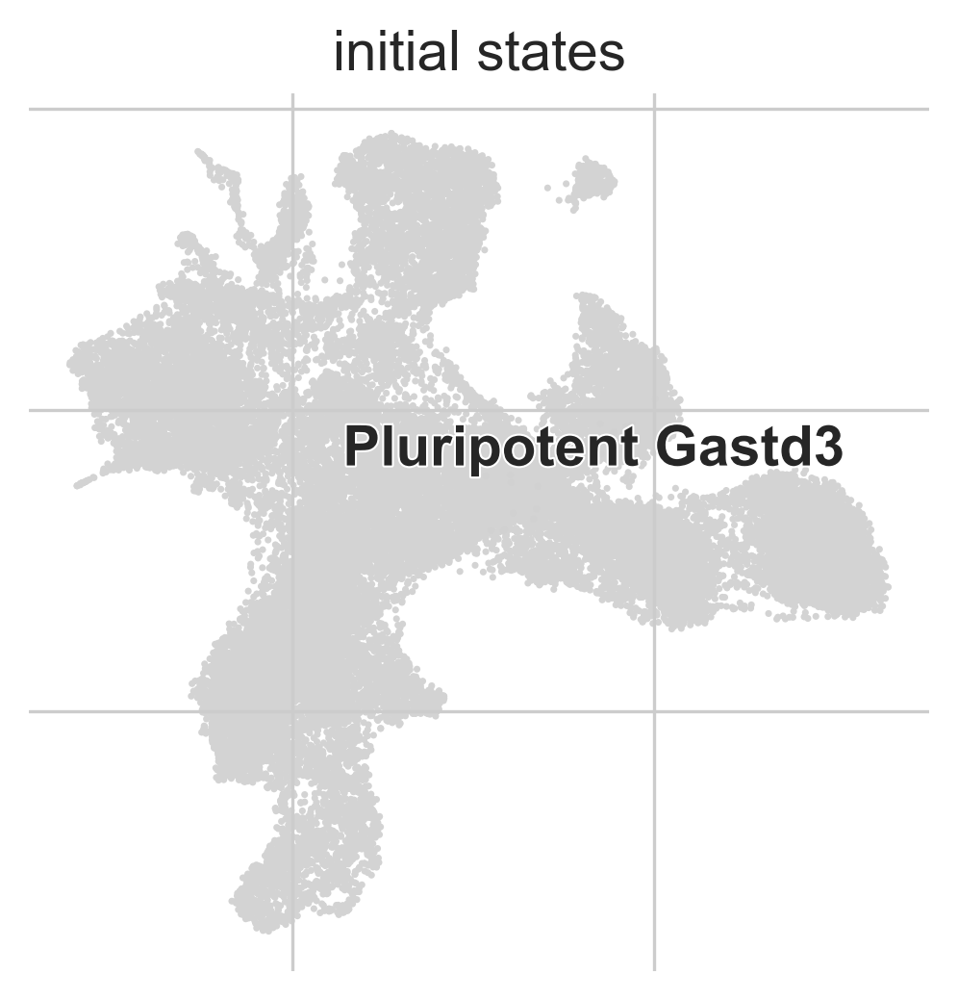

In [39]:
cr.tl.initial_states(rna, cluster_key="lin_day",n_jobs=1, backend='threading')
cr.pl.initial_states(rna, discrete=True)

In [40]:
obs['initial_states'] = rna.obs['initial_states']
obs.head(2)
#rna.obs['terminal_states']

,batch2,batch,day,replicates,mark,day_rep,dataset,cellnames,bc,cellname,...,umap_1D,umap_1D_rescale,lineage,celltype_general,lin_day,velocity_self_transition,terminal_states,terminal_states_probs,clusters_gradients,initial_states
index,,,,,,,,,,,,,,,,,,,,,
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AACCTGCT,341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,...,-19.564241,0.058016,Haemogenic,Haemogenic,Haemogenic Gastd5,0.186058,NaN,0.798214,Ectoderm Gastd7,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATGGTGG,310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,...,13.201415,0.642296,Ectoderm,Neural Progenitors,Ectoderm Gastd5,0.293731,NaN,0.778911,Ectoderm Gastd7,NaN


In [41]:
rna.obs = obs
rna.obs.head(2)

,batch2,batch,day,replicates,mark,day_rep,dataset,cellnames,bc,cellname,...,umap_1D,umap_1D_rescale,lineage,celltype_general,lin_day,velocity_self_transition,terminal_states,terminal_states_probs,clusters_gradients,initial_states
index,,,,,,,,,,,,,,,,,,,,,
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AACCTGCT,341,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,...,-19.564241,0.058016,Haemogenic,Haemogenic,Haemogenic Gastd5,0.186058,NaN,0.798214,Ectoderm Gastd7,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,Gastd5_rep2,old,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATGGTGG,310,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,...,13.201415,0.642296,Ectoderm,Neural Progenitors,Ectoderm Gastd5,0.293731,NaN,0.778911,Ectoderm Gastd7,NaN


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/1978823624.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineages(rna)


Computing absorption probabilities


  0%|          | 0/2 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:02)


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


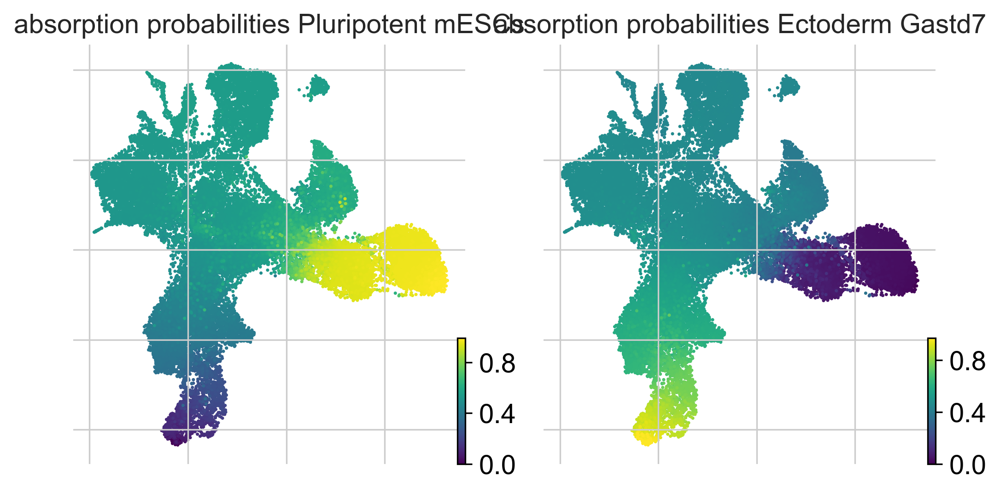

In [42]:
cr.tl.lineages(rna)
cr.pl.lineages(rna, same_plot=False)

In [43]:
sc.set_figure_params()
import matplotlib.pyplot as plt
plt.rcParams['axes.grid'] = False 

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


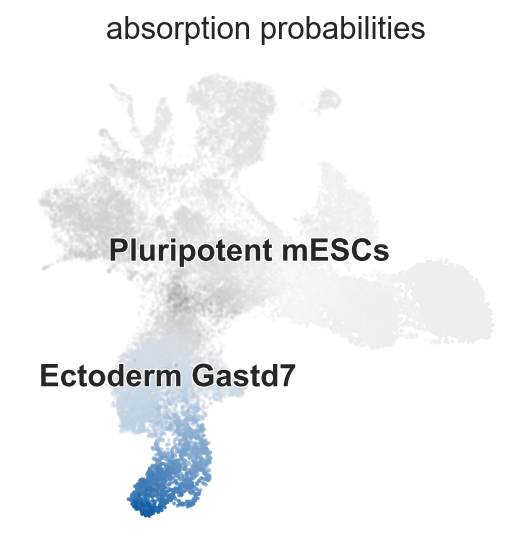

In [44]:
cr.pl.lineages(rna, same_plot=True)

In [45]:
scv.tl.recover_latent_time(
    rna, root_key="initial_states_probs", end_key="terminal_states_probs"
)

computing terminal states
    identified 7 regions of root cells and 2 regions of end points .
    finished (0:00:19) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells, terminal_states_probs as prior
    finished (0:00:21) --> added 
    'latent_time', shared time (adata.obs)


In [46]:
scv.tl.paga(
    rna,
    groups="lin_day",
    root_key="initial_states_probs",
    end_key="terminal_states_probs",
    use_time_prior="velocity_pseudotime",
)

running PAGA using priors: ['velocity_pseudotime', 'terminal_states_probs']
    finished (0:00:16) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [47]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
sc.set_figure_params(figsize=(6,6))

/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/2988647402.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/networkx/convert.py:157: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, create_using=create_using)
/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/cellrank/pl/_cluster_fates.py:200: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  _ = mpl.colorbar.ColorbarBase(


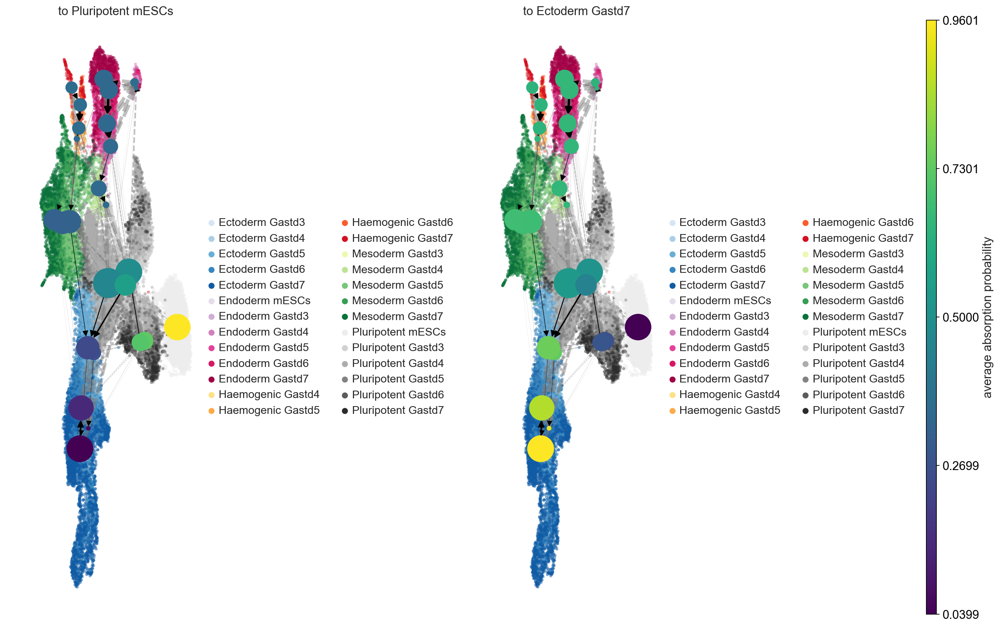

In [48]:
cr.pl.cluster_fates(
    rna,
    mode="paga",
    cluster_key="lin_day",
    basis="umap",
    legend_kwargs={"loc": "top right out"},
    #legend_loc="top left out",
    node_size_scale=3,
    edge_width_scale=1,
    max_edge_width=4,
    title="directed PAGA",
    figsize=(16,10),
    size = 50
)

In [49]:
cr.tl.lineage_drivers(rna)
#cr.tl.lineage_drivers(rna, lineages='Endoderm_Gastd6', use_raw=False, backward=False)

/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_6099/3849277173.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  cr.tl.lineage_drivers(rna)


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:04)


,Pluripotent mESCs_corr,Pluripotent mESCs_pval,Pluripotent mESCs_qval,Pluripotent mESCs_ci_low,Pluripotent mESCs_ci_high,Ectoderm Gastd7_corr,Ectoderm Gastd7_pval,Ectoderm Gastd7_qval,Ectoderm Gastd7_ci_low,Ectoderm Gastd7_ci_high
Gene,,,,,,,,,,
Tdh,0.744289,0.0,0.0,0.739778,0.748734,-0.744292,0.0,0.0,-0.748736,-0.739781
Tfcp2l1,0.719877,0.0,0.0,0.715005,0.724679,-0.719879,0.0,0.0,-0.724681,-0.715008
Mt2,0.710467,0.0,0.0,0.705460,0.715404,-0.710470,0.0,0.0,-0.715406,-0.705463
L1td1,0.708445,0.0,0.0,0.703409,0.713410,-0.708448,0.0,0.0,-0.713413,-0.703412
Esrrb,0.703805,0.0,0.0,0.698703,0.708836,-0.703808,0.0,0.0,-0.708839,-0.698706
...,...,...,...,...,...,...,...,...,...,...
Map1b,-0.510336,0.0,0.0,-0.517723,-0.502873,0.510333,0.0,0.0,0.502870,0.517719
Marcks,-0.530539,0.0,0.0,-0.537714,-0.523287,0.530538,0.0,0.0,0.523286,0.537713
Fzd3,-0.608809,0.0,0.0,-0.615088,-0.602452,0.608804,0.0,0.0,0.602447,0.615084


In [52]:
list(rna.varm['terminal_lineage_drivers'].columns)

['Pluripotent mESCs_corr',
 'Pluripotent mESCs_pval',
 'Pluripotent mESCs_qval',
 'Pluripotent mESCs_ci_low',
 'Pluripotent mESCs_ci_high',
 'Ectoderm Gastd7_corr',
 'Ectoderm Gastd7_pval',
 'Ectoderm Gastd7_qval',
 'Ectoderm Gastd7_ci_low',
 'Ectoderm Gastd7_ci_high']

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


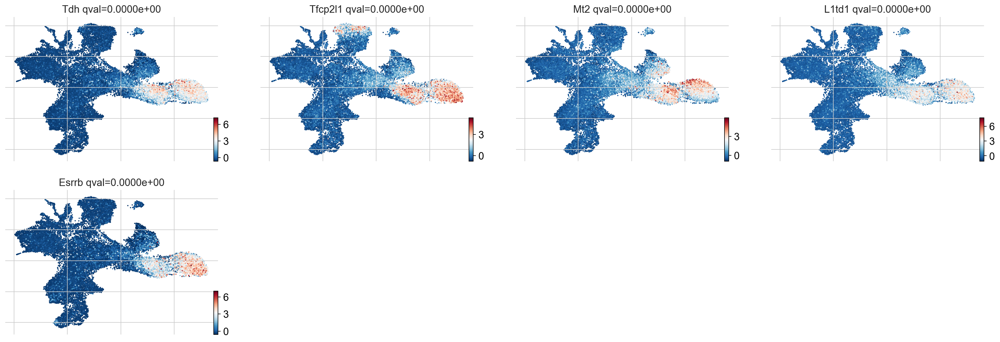

In [53]:
cr.pl.lineage_drivers(rna, lineage="Pluripotent mESCs", n_genes=5)

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


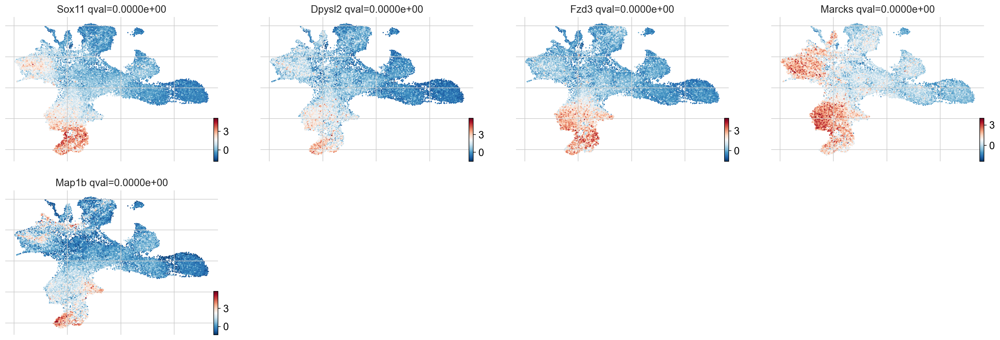

In [55]:
cr.pl.lineage_drivers(rna, lineage="Ectoderm Gastd7", n_genes=5)

In [54]:
rna.obs['lin_day']

index
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341    Haemogenic Gastd5
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310      Ectoderm Gastd5
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_302      Ectoderm Gastd5
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_5        Ectoderm Gastd5
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_184      Ectoderm Gastd5
                                                ...        
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_224       Ectoderm Gastd7
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_236       Ectoderm Gastd7
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_199       Ectoderm Gastd7
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_32        Ectoderm Gastd7
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_45        Ectoderm Gastd7
Name: lin_day, Length: 38117, dtype: category
Categories (26, object): ['Ectoderm Gastd3', 'Ectoderm Gastd4', 'Ectoderm Gastd5', 'Ectoderm Gastd6', ..., 'Pluripotent Gastd4', 'Pluripotent Gastd5', 'Pluripotent Gastd6', 'Pluripotent Gastd7']

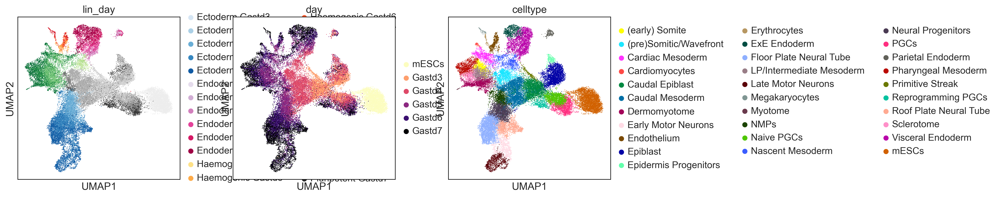

In [97]:
sc.pl.umap(rna,color = ['lin_day','day','celltype'])

In [102]:
list(rna[rna.obs["day"] == "Gastd3"].obs['celltype'].unique())

['Epiblast',
 'Caudal Epiblast',
 'Primitive Streak',
 'Naive PGCs',
 'Reprogramming PGCs',
 'Parietal Endoderm',
 'Caudal Mesoderm',
 'PGCs',
 'Nascent Mesoderm',
 'Epidermis Progenitors',
 'Late Motor Neurons',
 'mESCs']

In [113]:
rna.obs['ct_day'] = rna.obs['celltype'].astype(str) + ' ' +rna.obs['day'].astype(str)
rna.obs['ct_day'] = rna.obs['ct_day'].astype('category')


In [117]:
root_idx

15302

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


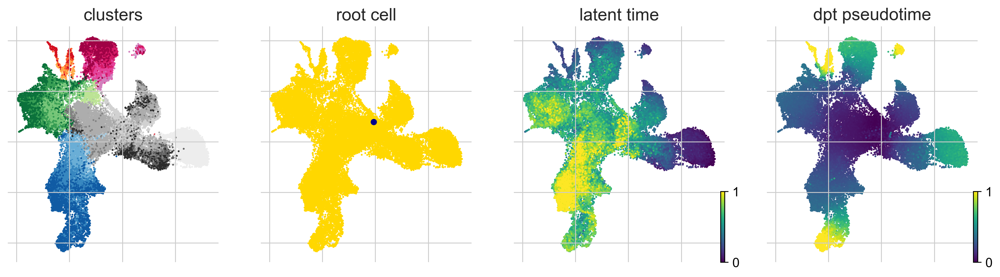

In [120]:
# compue DPT, starting from CellRank defined root cell
#root_idx = np.where(rna.obs["lin_day"] == "Pluripotent Gastd3")[0][0]
#root_idx = np.where(rna.obs == rna.obs['root_cells'].sort_values().index[0])[0][0]
root_idx = np.where(rna.obs["ct_day"] == "Caudal Epiblast Gastd3")[0][0]

rna.uns["iroot"] = root_idx
sc.tl.dpt(rna)

scv.pl.scatter(
    rna,
    color=["lin_day", root_idx, "latent_time", "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["clusters", "root cell", "latent time", "dpt pseudotime"],
)

In [121]:
model = cr.ul.models.GAM(rna)


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(


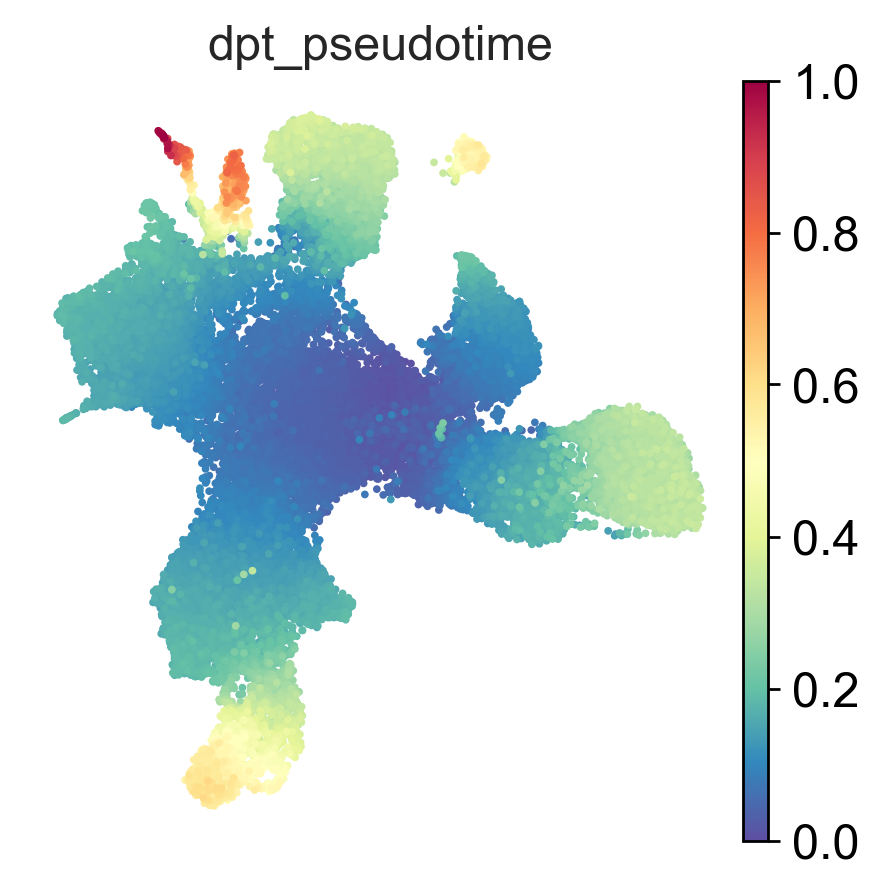

In [122]:
sc.set_figure_params(dpi = 125)
sc.pl.umap(rna,color='dpt_pseudotime', frameon=False, size = 20, cmap = 'Spectral_r') 
        #   vmin = 0.2, vmax = 0.6)

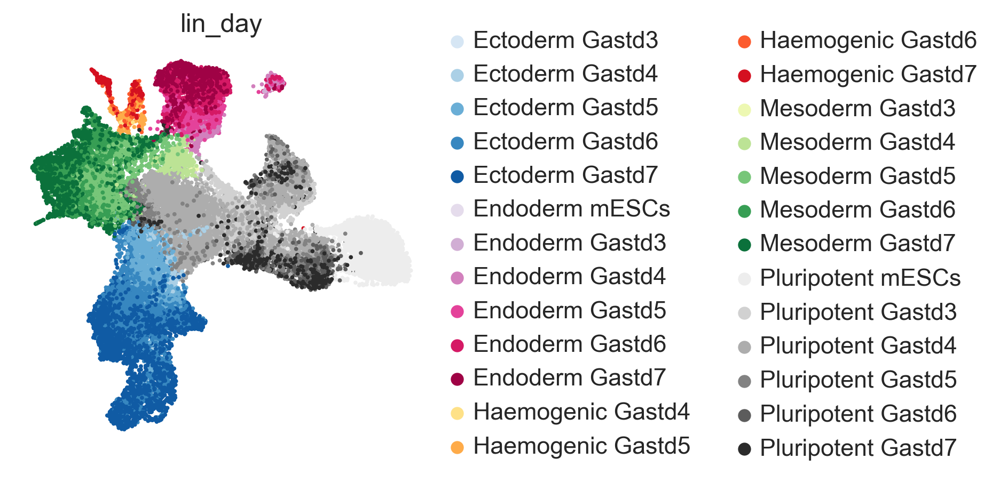

In [123]:
sc.pl.umap(rna,color='lin_day', frameon=False, size = 20)# cmap = 'Spectral_r') 
        #   vmin = 0.2, vmax = 0.6)

/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(


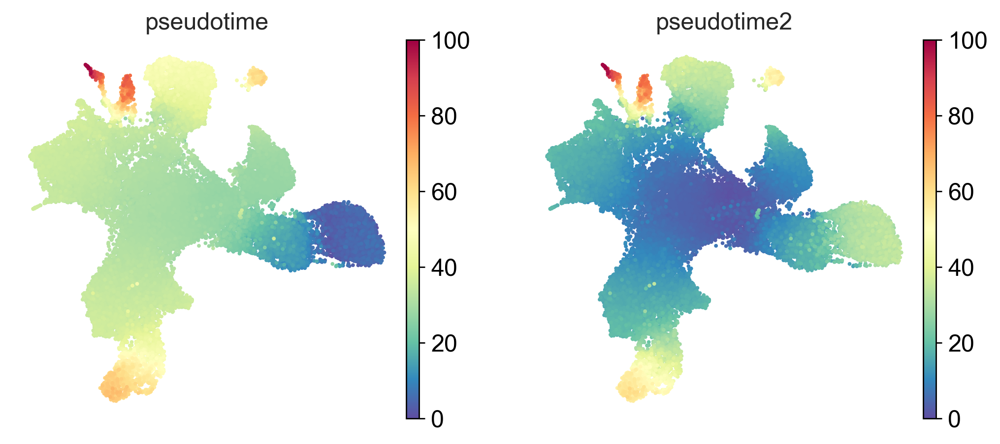

In [124]:
rna.obs['pseudotime2'] = rna.obs['dpt_pseudotime'] *100
sc.pl.umap(rna,color=['pseudotime','pseudotime2'], frameon=False, size = 20, cmap = 'Spectral_r') 


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(


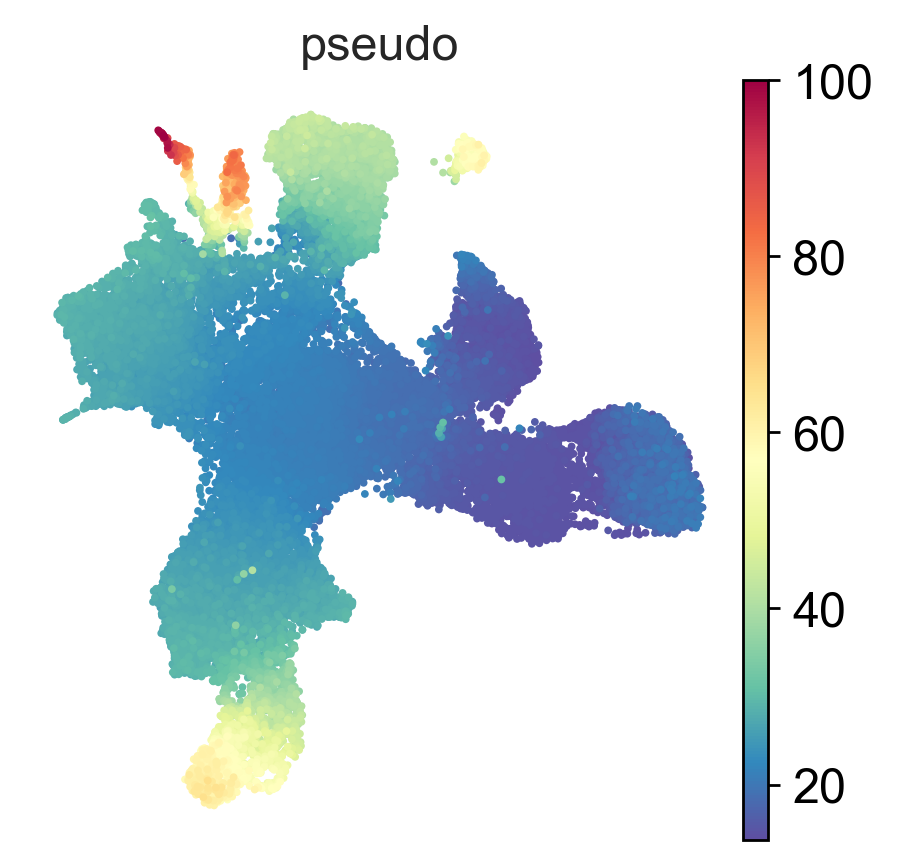

In [73]:
rna.obs['pseudo'] = (rna.obs['pseudotime2'] + rna.obs['pseudotime'])/2
sc.pl.umap(rna,color=['pseudo'], frameon=False, size = 20, cmap = 'Spectral_r') 


save as csv

In [70]:
rna.obs[['pseudotime','pseudotime2']].to_csv('20230625_pseudotime.csv')

In [168]:
model = cr.ul.models.GAM(rna,distribution='gaussian', link='identity')

Computing trends using `1` core(s)


  0%|          | 0/1 [00:00<?, ?gene/s]

    Finish (0:00:00)
Plotting trends


/Users/m.blotenburg/miniconda3/envs/multiconda2/lib/python3.8/site-packages/cellrank/pl/_utils.py:796: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  _ = mpl.colorbar.ColorbarBase(


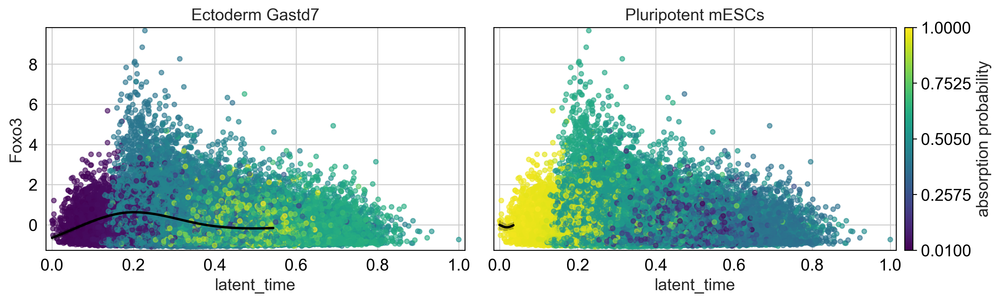

In [158]:
cr.pl.gene_trends(
    rna,
    model=model,
    genes=['Foxo3'],
)